# Прекод

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные лежат в папке `/datasets/image_search/`.

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## Настройки рабочей тетради

In [1]:
import sys
#!{sys.executable} -m spacy download en_core_web_sm
#!pip install keras_bert
#!pip install tokenization
import os


import gensim
import gensim.models as g
import gensim.downloader
from spacy.tokenizer import Tokenizer
from spacy.lang.en import English

from sklearn.model_selection import GroupShuffleSplit

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D
from PIL import Image

from tensorflow.keras.metrics import RootMeanSquaredError

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from math import sqrt

from nltk.corpus import stopwords
import spacy
from sklearn.feature_extraction.text import TfidfVectorizer
from spacy.lang.de.stop_words import STOP_WORDS
from tqdm import notebook

import nltk
#nltk.download('stopwords')

!pip install sentence_transformers
from sentence_transformers import SentenceTransformer, util

import warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
# Путь к директории с данными

path = '/datasets/'

## 2. Загрузка данных

In [3]:
def make_description(data):
    display(data.head())
    data.info()
    print('\nКоличество дубликатов:', data.duplicated().sum())
    print('\nКоличество пропусков:\n', data.isna().sum())

In [4]:
train_dataset = pd.read_csv(os.path.join(path, 'train_dataset.csv'))


In [5]:
crowd_annotations = pd.read_csv(os.path.join(path, 'CrowdAnnotations.tsv'), sep="\t", 
                                names=['image', 'query_id', 'proportion_true', 'num_true', 'num_false'])

In [6]:
expert_annotations = pd.read_csv(os.path.join(path, 'ExpertAnnotations.tsv'), sep="\t",
                                names=['image', 'query_id', 'expert_1', 'expert_2', 'expert_3'])

In [7]:
test_images = pd.read_csv(os.path.join(path, 'test_images.csv'))
test_queries = pd.read_csv(os.path.join(path, 'test_queries.csv'), sep='|', index_col='Unnamed: 0')

<b>Вывод</b>

Данные загружены. В данных отсутствуют пропуски или дубликаты

## 3. Исследовательский анализ данных

### Обучающий набор данных

<b>Описание</b>

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

In [8]:
make_description(train_dataset)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB

Количество дубликатов: 0

Количество пропусков:
 image         0
query_id      0
query_text    0
dtype: int64


In [9]:
print('Количество уникальных изображений в обучающем наборе данных:', train_dataset['image'].nunique())
print('Количество уникальных запросов в обучающем наборе данных:', train_dataset['query_text'].nunique())

Количество уникальных изображений в обучающем наборе данных: 1000
Количество уникальных запросов в обучающем наборе данных: 977


Количество уникальных изображений и запросов практически одинаковое.

Посмотрим на сами изображения и запросы к ним.

In [10]:
def print_images(dataset, directory_path):
  rows = 4
  columns = 4
  count = 1

  fig = plt.figure(figsize=(16, 16))
  for _, file, _, query_text in dataset.sample(rows * columns).itertuples():
      img = Image.open(os.path.join(path, directory_path+file))
      fig.add_subplot(rows, columns, count)
      count += 1
      plt.imshow(np.array(img))
      plt.axis("off")
      chunks, chunk_size = len(query_text), 22
      plt.title(
          "\n".join([query_text[i : i + chunk_size] for i in range(0, chunks, chunk_size)])
          );

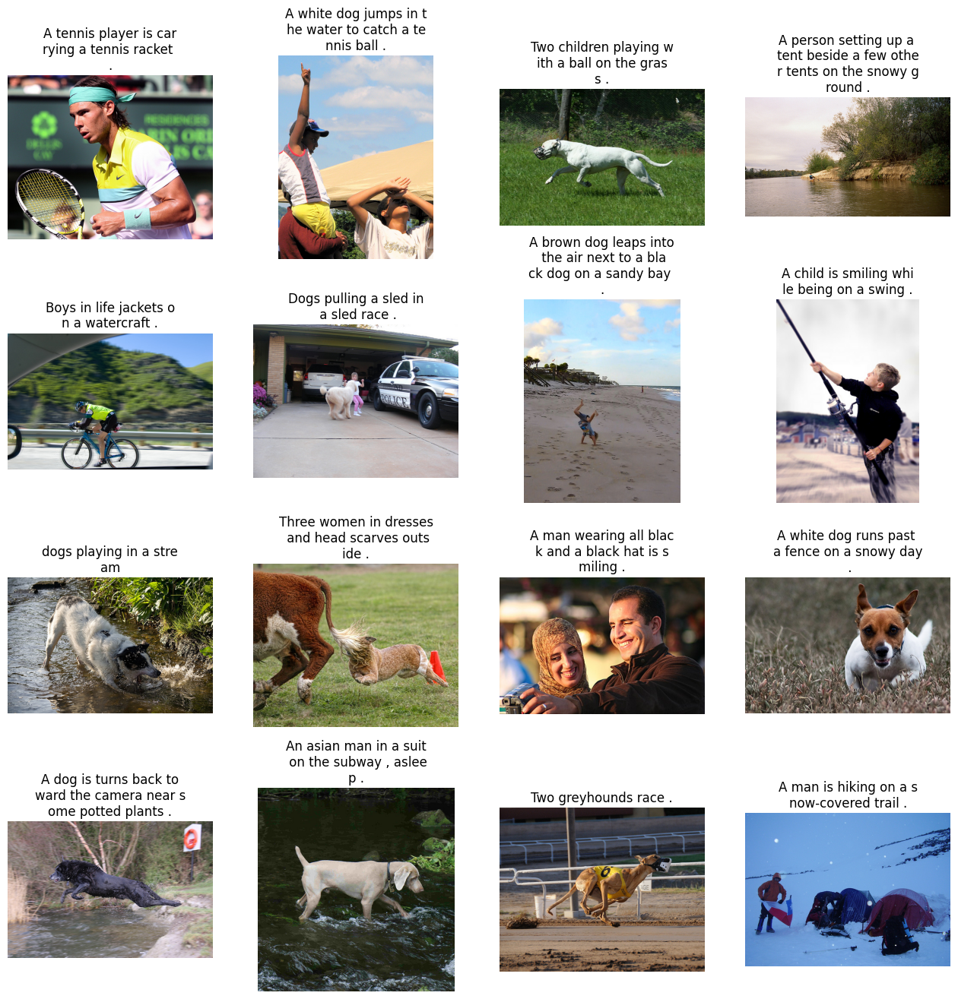

In [11]:
print_images(train_dataset, 'train_images/')

<b>Вывод</b>

В обучающем датасете отсутствуют дубликаты и пропуски. У нас всего 5822 записей для обучения, что может быть недостаточно для обучения нейронной сети. Количество уникальных изображений и запросов практически одинаковое. Изображения предоставлены в разном размере.

### Тестовый набор данных

<b>Описание</b>

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

In [12]:
make_description(test_queries)

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB

Количество дубликатов: 0

Количество пропусков:
 query_id      0
query_text    0
image         0
dtype: int64


In [13]:
print('Количество уникальных изображений в обучающем наборе данных:', test_queries['image'].nunique())
print('Количество уникальных запросов в обучающем наборе данных:', test_queries['query_text'].nunique())

Количество уникальных изображений в обучающем наборе данных: 100
Количество уникальных запросов в обучающем наборе данных: 500


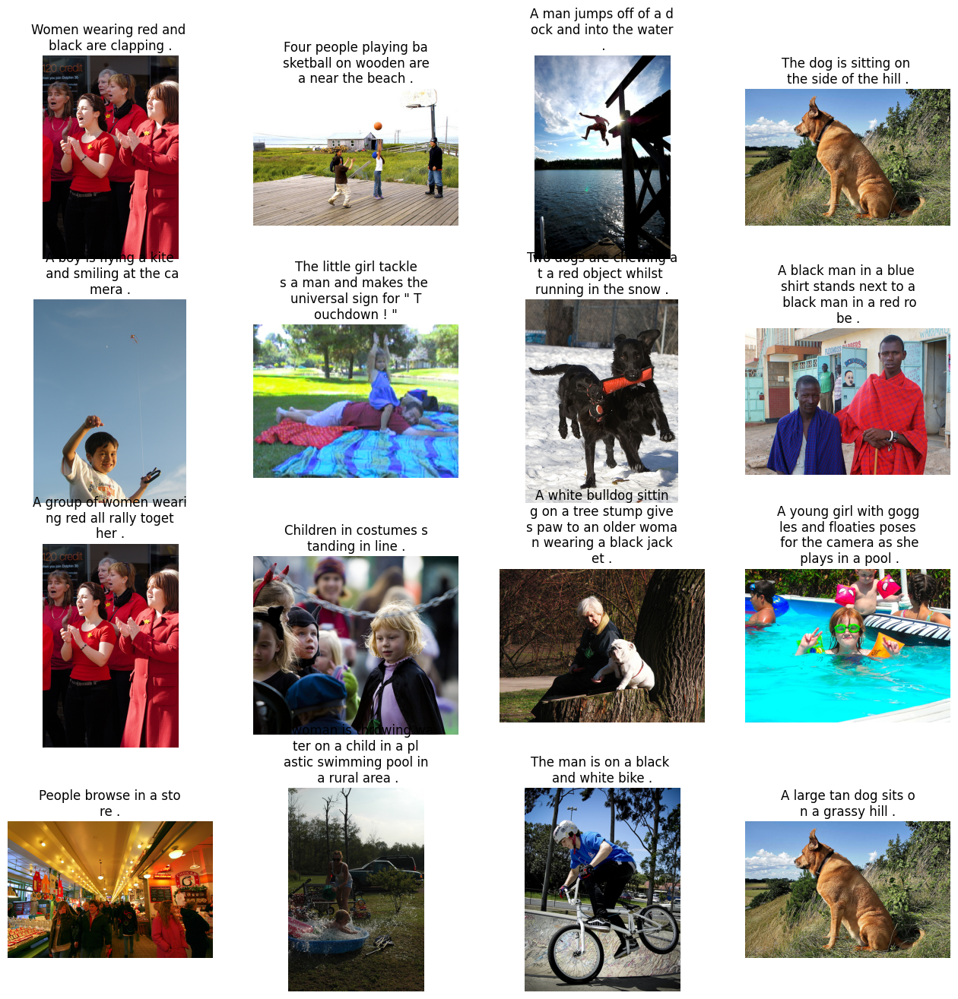

In [14]:
cols = test_queries.columns.tolist()
cols = cols[-1:] + cols[:-1]
test_queries = test_queries[cols]

print_images(test_queries, 'test_images/')

<b>Вывод</b>

В тестовом датасете отсутствуют дубликаты и пропуски, всего 500 записей. Для теста есть 100 уникальных изображений и 500 запросов, по 5 на каждое изображение.

Изображения также предоставлены в разном размере.

### Оценки экспертов

<b>Описание</b>

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

In [15]:
make_description(expert_annotations)

,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB

Количество дубликатов: 0

Количество пропусков:
 image       0
query_id    0
expert_1    0
expert_2    0
expert_3    0
dtype: int64


In [16]:
print('Количество уникальных изображений в обучающем наборе данных:', expert_annotations['image'].nunique())
print('Количество уникальных запросов в обучающем наборе данных:', expert_annotations['query_id'].nunique())

Количество уникальных изображений в обучающем наборе данных: 1000
Количество уникальных запросов в обучающем наборе данных: 977


<b> Вывод </b>

Представлены данные оценок трех экспертов для пар изображение-запрос. Всего 5822 записи об оценках. 

Оценки выставлены по четырехбальной шкале, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

Количество экспертных оценок равно количеству записей в обучающем датасете - каждой записи в обучающем наборе данных эксперты дали оценку соответствия.

### Оценки с краудсорсинга

<b>Описание</b>

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

In [17]:
make_description(crowd_annotations)

,image,query_id,proportion_true,num_true,num_false
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            47830 non-null  object 
 1   query_id         47830 non-null  object 
 2   proportion_true  47830 non-null  float64
 3   num_true         47830 non-null  int64  
 4   num_false        47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB

Количество дубликатов: 0

Количество пропусков:
 image              0
query_id           0
proportion_true    0
num_true           0
num_false          0
dtype: int64


In [18]:
print('Количество уникальных изображений в обучающем наборе данных:', crowd_annotations['image'].nunique())
print('Количество уникальных запросов в обучающем наборе данных:', crowd_annotations['query_id'].nunique())

Количество уникальных изображений в обучающем наборе данных: 1000
Количество уникальных запросов в обучающем наборе данных: 1000


In [19]:
print('Количество людей, которые выставляли', (crowd_annotations['num_true']+crowd_annotations['num_false']).unique())

Количество людей, которые выставляли [3 4 5 6]


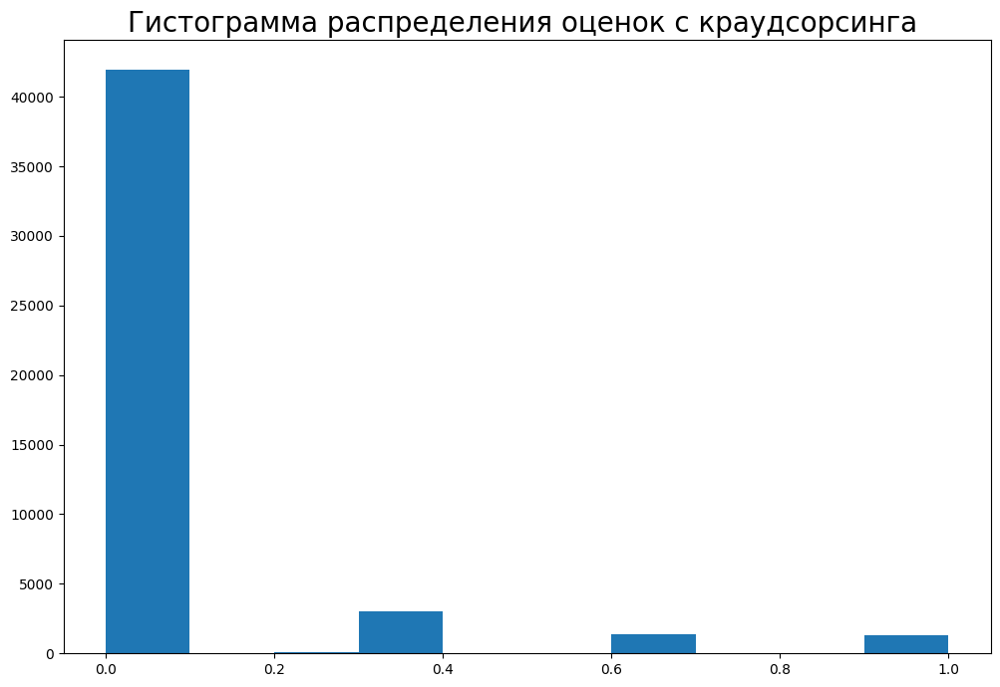

In [20]:
plt.figure(figsize=(12,8))
plt.hist(crowd_annotations['proportion_true'])
plt.title('Гистограмма распределения оценок с краудсорсинга ', fontsize=20)
plt.show()

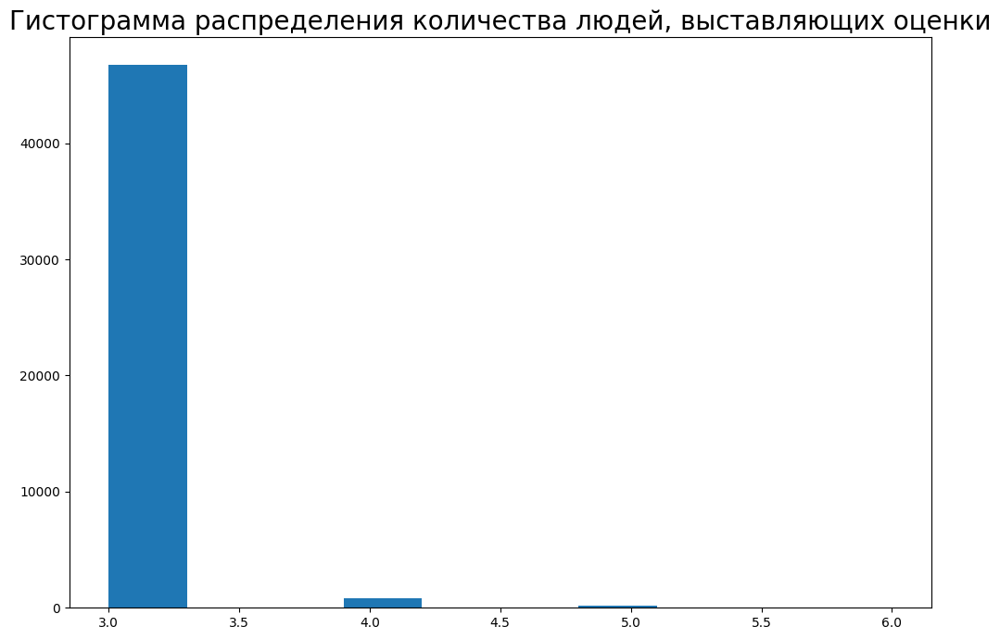

In [21]:

plt.figure(figsize=(12,8))
plt.hist((crowd_annotations['num_true']+crowd_annotations['num_false']))
plt.title('Гистограмма распределения количества людей, выставляющих оценки', fontsize=20)
plt.show()

<b>Вывод</b>

Оценок с краудсорсинга почти в 9 раз больше, около 48тыс., чем в обучающем датасете.

На краудсорсинг люди ставили оценки соответствует/не соответствует предложенное изображение описанию. Для дальнейшей работы нам будет интересен только столбец с долей людей, подтвердивших, что описание соответствует изображению, т.к. наша модель должна будет предсказывать вероятность соответствия от 0 до 1.

Каждую пару изображение-запрос оценивали от 3 до 6 человек (подавляющее большинство оценок поставлены тремя людьми).

## 4. Преобразование данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета. <b>воспользуемся этим способом</b>.

В файле с краудсорсинговыми оценками информация расположена в таком порядке: 

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке. 
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок будем либо брать имеющуюся, если доступна только одна из них, либо объединять их в одну: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.



In [22]:
# Обработаем оценки экспертов

for i in expert_annotations.index:
    
    if expert_annotations.loc[i, ['expert_1', 'expert_2', 'expert_3']].nunique() < 3:
        expert_annotations.loc[i, 'final_expert'] = int(expert_annotations.loc[i, ['expert_1', 'expert_2', 'expert_3']].mode())
        if expert_annotations.loc[i, 'final_expert'] == 1:
            expert_annotations.loc[i, 'final'] = 0
        elif expert_annotations.loc[i, 'final_expert'] == 2:
            expert_annotations.loc[i, 'final'] = 0.3
        elif expert_annotations.loc[i, 'final_expert'] == 3:
            expert_annotations.loc[i, 'final'] = 0.7
        elif expert_annotations.loc[i, 'final_expert'] == 4:
            expert_annotations.loc[i, 'final'] = 1
    else:
        expert_annotations = expert_annotations.drop(i, axis=0)
        
expert_annotations.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5696 entries, 0 to 5821
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         5696 non-null   object 
 1   query_id      5696 non-null   object 
 2   expert_1      5696 non-null   int64  
 3   expert_2      5696 non-null   int64  
 4   expert_3      5696 non-null   int64  
 5   final_expert  5696 non-null   float64
 6   final         5696 non-null   float64
dtypes: float64(2), int64(3), object(2)
memory usage: 485.0+ KB


Потеря данных небольшая - меньше 200 строк.

In [23]:
# Перенесём оценки в один датасет

for i in train_dataset.index:
    if train_dataset.loc[i, 'image'] in list(expert_annotations['image']):
        temp_im = expert_annotations.loc[expert_annotations['image'] == train_dataset.loc[i, 'image']].copy()
        if train_dataset.loc[i, 'query_id'] in list(temp_im['query_id']):
            train_dataset.loc[i, 'expert_rate'] = float(temp_im.loc[temp_im['query_id'] == train_dataset.loc[i, 'query_id']]['final'])
            
    if train_dataset.loc[i, 'image'] in list(crowd_annotations['image']):
        temp_im = crowd_annotations.loc[crowd_annotations['image'] == train_dataset.loc[i, 'image']].copy()
        if train_dataset.loc[i, 'query_id'] in list(temp_im['query_id']):
            train_dataset.loc[i, 'crowd_rate'] = float(temp_im.loc[temp_im['query_id'] == train_dataset.loc[i, 'query_id']]['proportion_true'])


train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        5822 non-null   object 
 1   query_id     5822 non-null   object 
 2   query_text   5822 non-null   object 
 3   expert_rate  5696 non-null   float64
 4   crowd_rate   2329 non-null   float64
dtypes: float64(2), object(3)
memory usage: 227.5+ KB


Оценки с краудсорсинга есть для половины запросов тренировочного датасета.

In [24]:
# Объединим оценки экспертов и с краудсорсинга. Если нет ни одной, то удалим запись из датасета.

train_dataset = train_dataset.fillna(-1)

for i in train_dataset.index:
    if train_dataset.loc[i, 'expert_rate'] == -1 and train_dataset.loc[i, 'crowd_rate'] == -1:
        train_dataset = train_dataset.drop(i, axis=0)
    elif train_dataset.loc[i, 'expert_rate'] != -1 and train_dataset.loc[i, 'crowd_rate'] != -1:
        train_dataset.loc[i, 'final_rate'] = train_dataset.loc[i, 'expert_rate'] * 0.6 +  train_dataset.loc[i, 'crowd_rate'] * 0.4
    elif train_dataset.loc[i, 'expert_rate'] != -1 and train_dataset.loc[i, 'crowd_rate'] == -1:
        train_dataset.loc[i, 'final_rate'] = train_dataset.loc[i, 'expert_rate']
    elif train_dataset.loc[i, 'expert_rate'] == -1 and train_dataset.loc[i, 'crowd_rate'] != -1:
        train_dataset.loc[i, 'final_rate'] = train_dataset.loc[i, 'crowd_rate']


train_dataset = train_dataset.reset_index(drop=True)
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5767 entries, 0 to 5766
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        5767 non-null   object 
 1   query_id     5767 non-null   object 
 2   query_text   5767 non-null   object 
 3   expert_rate  5767 non-null   float64
 4   crowd_rate   5767 non-null   float64
 5   final_rate   5767 non-null   float64
dtypes: float64(3), object(3)
memory usage: 270.5+ KB


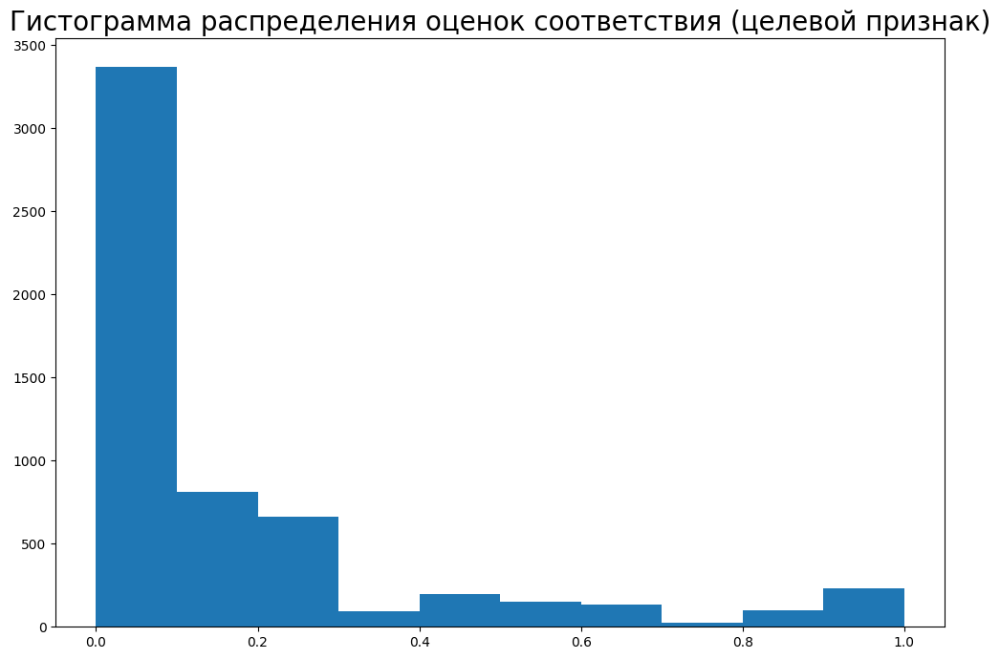

In [25]:
plt.figure(figsize=(12,8))
plt.hist(train_dataset['final_rate'])
plt.title('Гистограмма распределения оценок соответствия (целевой признак)', fontsize=20)
plt.show()

<b>Вывод</b>

Больше половины оценок соответствия равны нулю.

## 5. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
> 

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

In [26]:
# Удаление несоответствующих элементов из обучающей выборки

taboo_list = ['young', 'child', 'children', 'baby', 'kid', 'kids', 'newborn', 'teen', 'teenager']

to_drop = []

for i in train_dataset.index:
  for word in train_dataset.loc[i, 'query_text'].split():
    if word in taboo_list:
      to_drop.append(i)

train_dataset = train_dataset.drop(to_drop, axis=0)
train_dataset.shape

train_dataset = train_dataset.reset_index(drop=True)

train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5013 entries, 0 to 5012
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        5013 non-null   object 
 1   query_id     5013 non-null   object 
 2   query_text   5013 non-null   object 
 3   expert_rate  5013 non-null   float64
 4   crowd_rate   5013 non-null   float64
 5   final_rate   5013 non-null   float64
dtypes: float64(3), object(3)
memory usage: 235.1+ KB


## 6. Векторизация изображений

Векторизацию изображений будем проводить с помощью ResNet50, оставив только сверточные слои и общий пулинг (чтобы получить вменяемое число признаков).

Т.к. нам придется это проводить и для обучающей, и для тестовой выборки, то целесообразнее будет написать этот этап предобработки в виде функции.

In [27]:
def prepare_images(image_dataset, path):
  '''Векторизация изображений из датасета'''
  
  test_datagen = ImageDataGenerator()
  test_datagen = test_datagen.flow_from_dataframe(
          dataframe=image_dataset,
          directory=path,
          x_col='image',
          y_col='image',
          target_size=(224, 224),
          batch_size=16,
          class_mode='raw',
          seed=12345)


  backbone = ResNet50(input_shape=(224, 224, 3),
                          weights='imagenet', 
                          include_top=False)

  model = Sequential()
  model.add(backbone)
  model.add(GlobalAveragePooling2D())
  model.compile(loss='mse',
                    metrics=['mean_absolute_error'])

  new_imgs = model.predict(test_datagen)

  img_df = pd.DataFrame(data = new_imgs)

  img_df = pd.concat([img_df, image_dataset['image']], axis=1)

  return img_df

In [28]:
images = prepare_images(train_dataset, os.path.join(path, 'train_images')).drop('image', axis=1)
images.shape

Found 5013 validated image filenames.
314/314 [==============================] - 1054s 3s/step


(5013, 2048)

<b>Вывод</b>

Изображения векторизированны

## 7. Векторизация текстов

Векторизацию текстов сделаем с помощью модели word2vec


In [29]:
nltk.download('stopwords')
nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])
for_lemm = []


for i in notebook.tqdm(train_dataset.index):
    doc = nlp(train_dataset.loc[i, 'query_text'])
    for_lemm.append(" ".join([token.lemma_ for token in doc]))
    
train_dataset['lemm_text'] = for_lemm

count_tf_idf = TfidfVectorizer(stop_words=list(STOP_WORDS))
count_tf_idf.fit(train_dataset['lemm_text'])

texts = count_tf_idf.transform(train_dataset['lemm_text'])
texts = pd.DataFrame(data=texts.toarray())


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


  0%|          | 0/5013 [00:00<?, ?it/s]

<b> Вывод </b>

Текстовые данные векторизированны

## 8. Объединение векторов

Объединим векторы изображений, текстов, финальной оценки и указателя на изображение (для последующей группировки)

In [30]:
img = pd.DataFrame(data = images)
df = pd.concat([img, texts], axis=1)
df = pd.concat([df, train_dataset['final_rate']], axis=1)
df = pd.concat([df, train_dataset['image']], axis=1)
df = df.reset_index(drop=True)
df.shape

(5013, 3195)

## 9. Обучение модели предсказания соответствия

Для обучения разделим датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit] из библиотеки sklearn.model_selection.



### Подготовка выборок

In [31]:
gss = GroupShuffleSplit(n_splits=1, train_size=0.9, random_state=12)
train_indices, test_indices = next(gss.split(X=df.drop(['final_rate', 'image'], axis=1), y=df['final_rate'], groups=df['image']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

features_train = train_df.drop(columns=['final_rate', 'image'])
target_train = train_df['final_rate']

features_valid = test_df.drop(columns=['final_rate', 'image'])
target_valid = test_df['final_rate']

### Обучение моделей

Попробуем обучить модели линейной регрессии, из библиотеки sklearn, и полносвязной нейронной сети, tensorflow.

Сравнивать модели будем по метрике RMSE.

In [32]:
def rmse(actual, predict):
    predict = np.array(predict)
    actual = np.array(actual)

    distance = predict - actual

    square_distance = distance ** 2

    mean_square_distance = square_distance.mean()

    score = np.sqrt(mean_square_distance)

    return score

In [33]:
# linearregression

model_linear = LinearRegression()
model_linear.fit(features_train, target_train)

preds_train = model_linear.predict(features_train)
rmse_train = rmse(target_train, preds_train)

preds_valid = model_linear.predict(features_valid)
rmse_valid = rmse(target_valid, preds_valid)

print("RMSE обучающей выборки:", rmse_train)
print("RMSE тестовой выборки: ", rmse_valid)

RMSE обучающей выборки: 0.19713109584384897
RMSE тестовой выборки:  14275243.396789677


In [34]:
# dense

model_dense = Sequential()

model_dense.add(Dense(features_train.shape[1], activation='relu'))
model_dense.add(Dense(256, activation='relu'))  
model_dense.add(Dense(128, activation='relu'))  
model_dense.add(Dense(4, activation='relu'))  

model_dense.add(Dense(1, activation='relu')) 
model_dense.add(Flatten())

optimizer = Adam(learning_rate=1e-6)

model_dense.compile(optimizer=optimizer, loss='mean_squared_error', metrics=[RootMeanSquaredError()])

model_dense.fit(features_train, target_train, epochs=20, verbose=2,
          validation_data=(features_valid, target_valid))



Epoch 1/20
142/142 - 33s - loss: 0.1015 - root_mean_squared_error: 0.3185 - val_loss: 0.0919 - val_root_mean_squared_error: 0.3032 - 33s/epoch - 231ms/step
Epoch 2/20
142/142 - 31s - loss: 0.1015 - root_mean_squared_error: 0.3185 - val_loss: 0.0919 - val_root_mean_squared_error: 0.3031 - 31s/epoch - 218ms/step
Epoch 3/20
142/142 - 30s - loss: 0.1014 - root_mean_squared_error: 0.3185 - val_loss: 0.0918 - val_root_mean_squared_error: 0.3030 - 30s/epoch - 212ms/step
Epoch 4/20
142/142 - 31s - loss: 0.1014 - root_mean_squared_error: 0.3184 - val_loss: 0.0917 - val_root_mean_squared_error: 0.3028 - 31s/epoch - 215ms/step
Epoch 5/20
142/142 - 30s - loss: 0.0970 - root_mean_squared_error: 0.3115 - val_loss: 0.0835 - val_root_mean_squared_error: 0.2889 - 30s/epoch - 214ms/step
Epoch 6/20
142/142 - 30s - loss: 0.0903 - root_mean_squared_error: 0.3005 - val_loss: 0.0787 - val_root_mean_squared_error: 0.2806 - 30s/epoch - 214ms/step
Epoch 7/20
142/142 - 30s - loss: 0.0857 - root_mean_squared_erro

In [35]:
preds_valid = model_dense.predict(features_valid).flatten()
rmse_valid = rmse(target_valid, preds_valid)

print("RMSE обучающей выборки:", rmse_train)
print("RMSE тестовой выборки: ", rmse_valid)

16/16 [==============================] - 1s 44ms/step
RMSE обучающей выборки: 0.19713109584384897
RMSE тестовой выборки:  0.25520028042202175


<b> Вывод </b> 

Обучены две модели: линейная регрессия и полносвязная нейронная сеть. Линейная регрессия не даёт адекватного значения контрольной метрике на валидационной выборке. Нейронная сеть показывает значение RMSE на валидационной выборке, равное 0.26.

## 10. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [36]:
# Подготовка тестовых изображений.

img_features_test = prepare_images(test_images, os.path.join(path, 'test_images'))
img_features_test.shape

Found 100 validated image filenames.
7/7 [==============================] - 21s 3s/step


(100, 2049)

In [37]:
def find_image(query, image_dataset=img_features_test):
    ''' Нахождение изображения по запросу из выбранного датасета изображений '''

    for word in query.split():
        if word in taboo_list:
            print('This image is unavailable in your country in compliance with local laws')
            return

    doc = nlp(query)
    lemm_text = " ".join([token.lemma_ for token in doc])
        
    temp_img_df = image_dataset.copy()
    temp_img_df = temp_img_df.drop('image', axis=1)
    temp_img_df['lemm_query'] = lemm_text

    texts = count_tf_idf.transform(temp_img_df['lemm_query'])
    texts = pd.DataFrame(data=texts.toarray())

    temp_img_df = temp_img_df.drop('lemm_query', axis=1)
    temp_img_df = pd.concat([temp_img_df, texts], axis=1)

    preds = model_dense.predict(temp_img_df, verbose=0).flatten()
    temp_img_df['predictions'] = preds
    result_i = temp_img_df.loc[temp_img_df['predictions'] == temp_img_df['predictions'].max()].index

    result_img = image_dataset.loc[result_i, 'image']

    return str(result_img.values[0]), float(temp_img_df.loc[result_i, 'predictions'])

This image is unavailable in your country in compliance with local laws


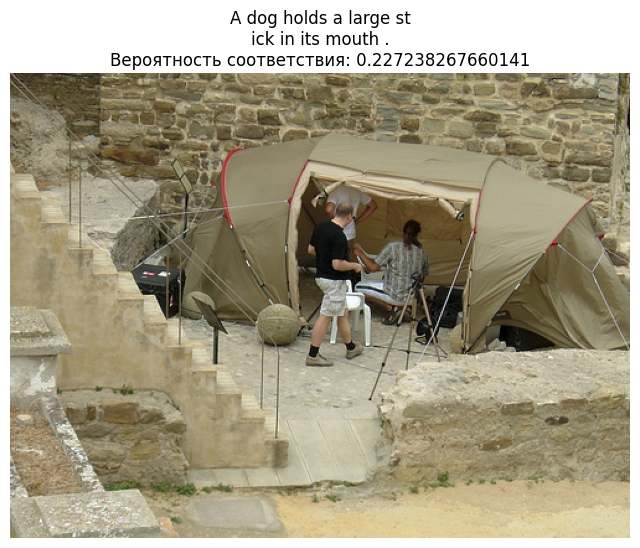

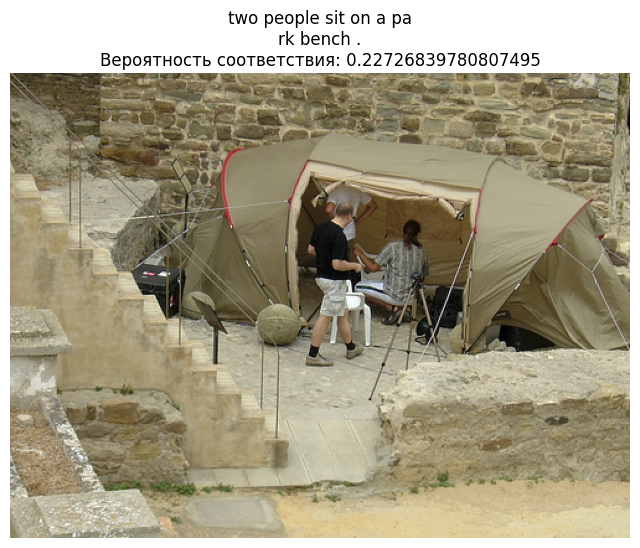

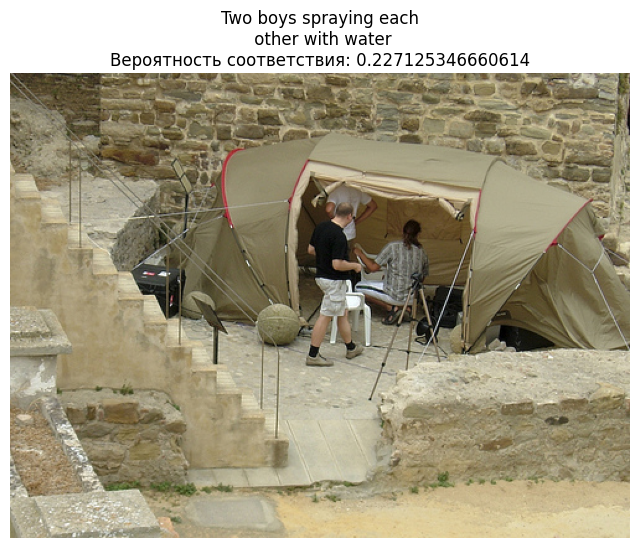

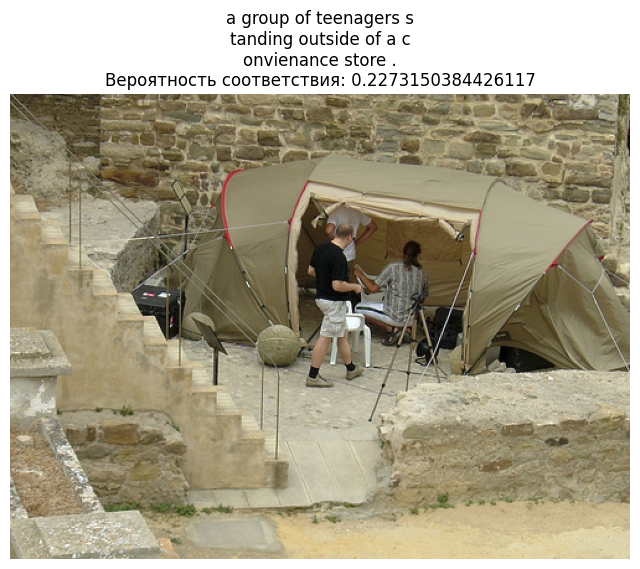

In [38]:
for j in np.random.randint(0, len(test_queries.index), 5):
    try:
        image, pred = find_image(test_queries.loc[j, 'query_text'])
        plt.figure(figsize=(8, 8))
        img = Image.open(os.path.join(path, 'test_images/'+image))
        plt.imshow(np.array(img))
        plt.axis("off")
        chunks, chunk_size = len(test_queries.loc[j, 'query_text']), 22
        plt.title("\n".join([test_queries.loc[j, 'query_text'][i : i + chunk_size] for i in range(0, chunks, chunk_size)])+'\nВероятность соответствия: '+str(pred));
    except:
        pass

<b>Модель CLIP</b>

Попробуем проверить, как на этом же датасете покажет себя модель CLIP

In [39]:
model_clip = SentenceTransformer('clip-ViT-B-32')

In [40]:
def find_image_clip(query, img_dataset=test_images):

    temp_img_df = img_dataset.copy()

    text_emb = model_clip.encode(query)
    
    for_preds = []
    for i in temp_img_df.index:
        img_emb = model_clip.encode(Image.open(os.path.join(path, 'test_images/'+str(temp_img_df.loc[i, 'image']))))
        cos_scores = util.cos_sim(img_emb, text_emb)
        for_preds.append(cos_scores)
    
    temp_img_df['predictions'] = for_preds
    result_i = temp_img_df.loc[temp_img_df['predictions'] == temp_img_df['predictions'].max()].index

    result_img = img_dataset.loc[result_i, 'image']

    return str(result_img.values[0]), float(temp_img_df.loc[result_i, 'predictions'].values[0])

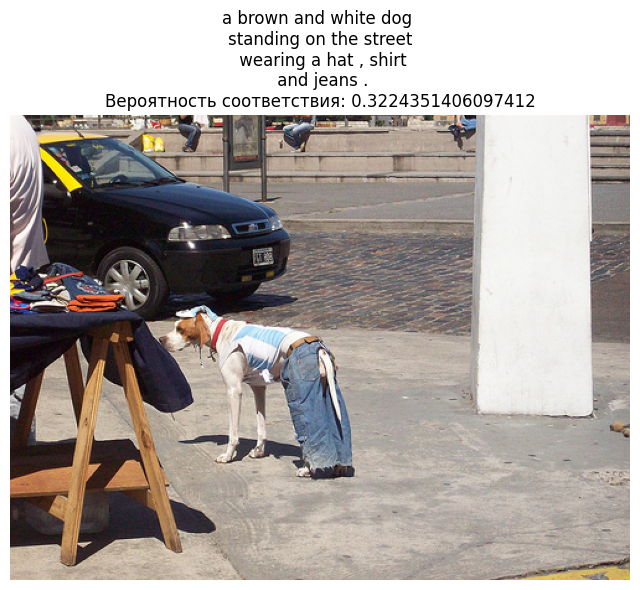

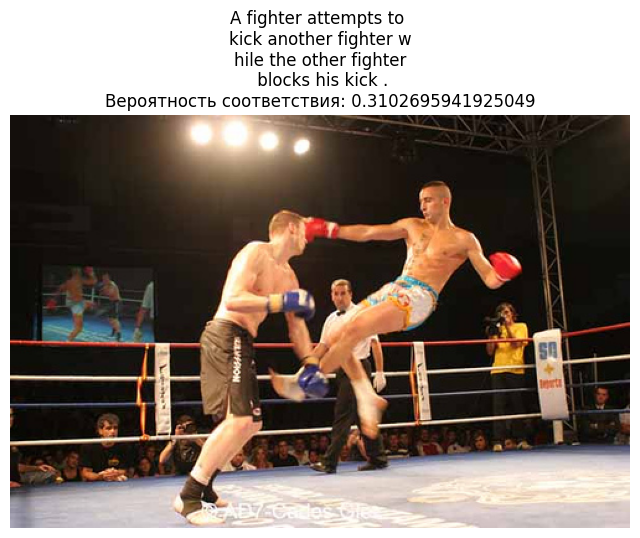

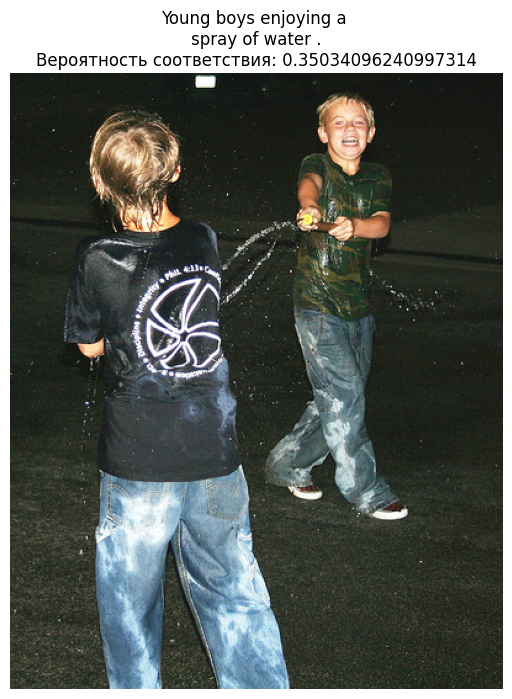

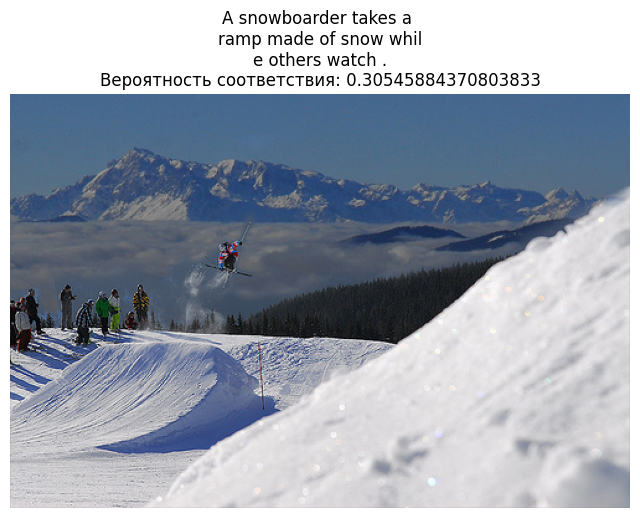

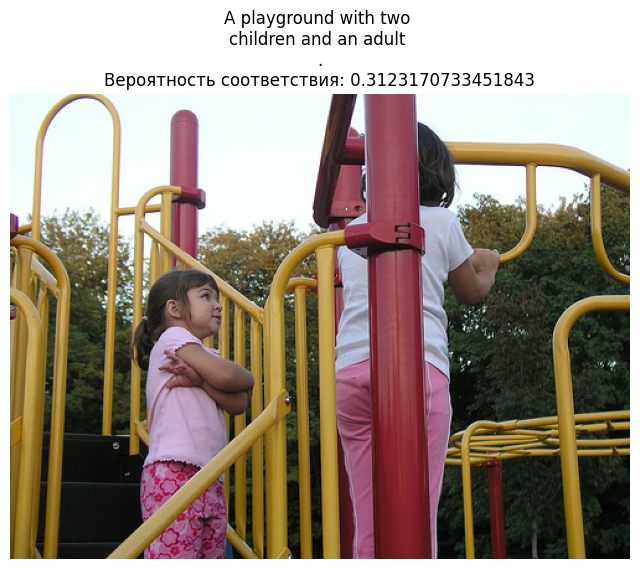

In [41]:
for j in np.random.randint(0, len(test_queries.index), 5):
    try:
        image, pred = find_image_clip(test_queries.loc[j, 'query_text'])
        plt.figure(figsize=(8, 8))
        img = Image.open(os.path.join(path, 'test_images/'+image))
        plt.imshow(np.array(img))
        plt.axis("off")
        chunks, chunk_size = len(test_queries.loc[j, 'query_text']), 22
        plt.title("\n".join([test_queries.loc[j, 'query_text'][i : i + chunk_size] for i in range(0, chunks, chunk_size)])+'\nВероятность соответствия: '+str(pred));
    except:
        pass

## 11. Вывод

На обучающем датасете были обучены две модели: модель линейной регрессии и модель полносвязной нейронной сети. Модель линейной регрессии показала очень плохой результат, поэтому далее продолжили работу с моделью полносвязной нейронной сети, однако на тестовой выборке она на все запросы выдаёт, визуально, плохой результат. Возможно, это происходит из-за: нехватки данных для обучения/неправильной векторизации данных/неправильного подхода.

Также на тестовой выборке была проверена работа модели CLIP от OPEN AI. Она работает заметно дольше, однако, визуально, выдаёт довольно точные прогнозы.